<a href="https://colab.research.google.com/github/Twilight-ops/yolo-pig-count/blob/main/YOLO_COUNT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Thu Oct 16 03:33:03 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   49C    P8             12W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!pip install -q ultralytics opencv-python-headless matplotlib tqdm scikit-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 75.6 MB/s eta 0:00:00


In [3]:
import ultralytics
from ultralytics import YOLO

print("Ultralytics YOLO version:", ultralytics.__version__)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics YOLO version: 8.3.214


In [4]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [5]:
!apt install -y unrar
!unrar x "/content/drive/MyDrive/PIG COUNTING.rar" "/content/dataset/"


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.

UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/drive/MyDrive/PIG COUNTING.rar

Creating    /content/dataset                                          OK
Creating    /content/dataset/PIG COUNTING                             OK
Creating    /content/dataset/PIG COUNTING/images                      OK
Extracting  /content/dataset/PIG COUNTING/images/._test                    0%  OK 
Extracting  /content/dataset/PIG COUNTING/images/._train                   0%  OK 
Creating    /content/dataset/PIG COUNTING/images/test                 OK
Extracting  /content/dataset/PIG COUNTING/images/test/1625695343_origin_1.jpg       0%  OK 
Extracting  /content/dataset/PIG COUNTING/images/test/1625695444_origin

In [6]:
import os
os.listdir('/content/dataset')


['PIG COUNTING']

In [7]:
import os

src = "/content/dataset/PIG COUNTING"
dst = "/content/pig_dataset"

if not os.path.exists(dst):
    os.symlink(src, dst)
print("✅ Dataset symlink created ->", dst)
print("contents:", os.listdir(dst))


✅ Dataset symlink created -> /content/pig_dataset
contents: ['images', 'labels']


In [8]:
import os, shutil, glob
from sklearn.model_selection import train_test_split

base_dir = "/content/pig_dataset"
img_train = f"{base_dir}/images/train"
lbl_train = f"{base_dir}/labels/train"
img_test = f"{base_dir}/images/test"
lbl_test = f"{base_dir}/labels/test"

# Move all test images & labels to train
for img_path in glob.glob(f"{img_test}/*.jpg"):
    base = os.path.splitext(os.path.basename(img_path))[0]
    lbl_path = os.path.join(lbl_test, base + ".txt")

    shutil.move(img_path, img_train)
    if os.path.exists(lbl_path):
        shutil.move(lbl_path, lbl_train)
print("All old test images & labels moved to training folder.")

#Re-split dataset (80% train, 20% test)
imgs = glob.glob(f"{img_train}/*.jpg")
train_imgs, test_imgs = train_test_split(imgs, test_size=0.2, random_state=42)

os.makedirs(img_test, exist_ok=True)
os.makedirs(lbl_test, exist_ok=True)

#Move selected test files
for img_path in test_imgs:
    base = os.path.splitext(os.path.basename(img_path))[0]
    lbl_path = os.path.join(lbl_train, base + ".txt")
    shutil.move(img_path, img_test)
    if os.path.exists(lbl_path):
        shutil.move(lbl_path, lbl_test)

print("New train/test split complete.")
print(f"Training images: {len(train_imgs)}")
print(f"Test images: {len(test_imgs)}")


All old test images & labels moved to training folder.
New train/test split complete.
Training images: 912
Test images: 228


In [9]:
data_yaml = """
train: /content/pig_dataset/images/train
val: /content/pig_dataset/images/test

nc: 1
names: ['pig']
"""
with open('/content/data.yaml', 'w') as f:
    f.write(data_yaml)
print(open('/content/data.yaml').read())



train: /content/pig_dataset/images/train
val: /content/pig_dataset/images/test

nc: 1
names: ['pig']



In [10]:
def check_pairs(img_dir, lbl_dir):
    im_bases = {os.path.splitext(f)[0] for f in os.listdir(img_dir) if f.lower().endswith(('.jpg','.png'))}
    lb_bases = {os.path.splitext(f)[0] for f in os.listdir(lbl_dir) if f.lower().endswith('.txt')}
    both = im_bases & lb_bases
    return len(im_bases), len(lb_bases), len(both), list(im_bases - lb_bases)[:3], list(lb_bases - im_bases)[:3]

print("train:", check_pairs("/content/pig_dataset/images/train","/content/pig_dataset/labels/train"))
print("val  :", check_pairs("/content/pig_dataset/images/test","/content/pig_dataset/labels/test"))


train: (912, 912, 912, [], [])
val  : (228, 228, 228, [], [])


In [11]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt')  # lightweight model for faster training

#Early stopping (patience=20)
model.train(
    data='/content/data.yaml',
    epochs=100,
    imgsz=640,
    batch=8,
    patience=20,
    name='pig_count_exp_clean'
)


Ultralytics 8.3.214 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=pig_count_exp_clean, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=20, perspective=0.0, plots=True, pos

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fbafb1713a0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [16]:
import os

base_path = "/content/runs/detect"
exp_list = sorted(os.listdir(base_path), key=lambda x: os.path.getmtime(os.path.join(base_path, x)))
print("📂 YOLO experiments found:", exp_list)
print("\n✅ Your latest run likely is:", exp_list[-1])


📂 YOLO experiments found: ['pig_count_exp_clean']

✅ Your latest run likely is: pig_count_exp_clean


📁 Results directory: /content/runs/detect/pig_count_exp_clean

Weights:
 - best.pt: True
 - last.pt: True


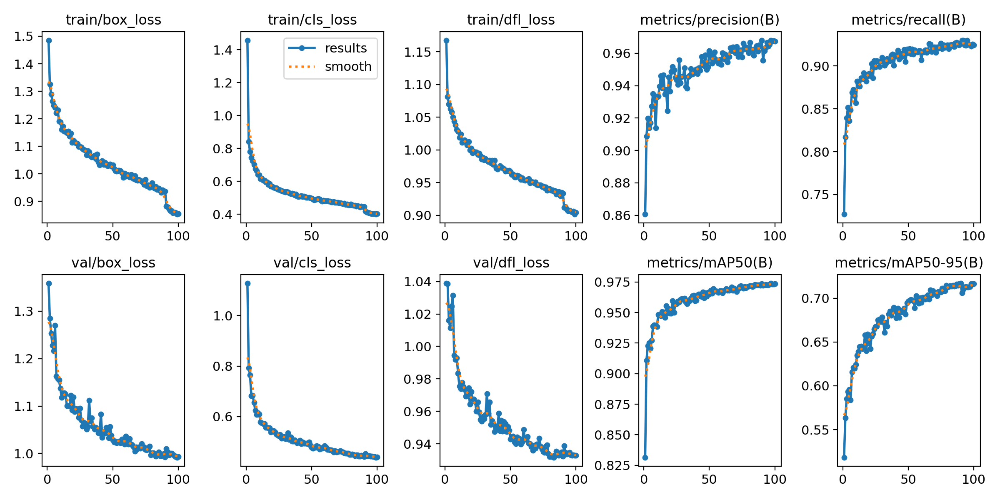

In [17]:
exp_name = exp_list[-1]  # use the last run from above
result_dir = f"/content/runs/detect/{exp_name}"
print("📁 Results directory:", result_dir)

# Key files
print("\nWeights:")
print(" - best.pt:", os.path.exists(os.path.join(result_dir, 'weights/best.pt')))
print(" - last.pt:", os.path.exists(os.path.join(result_dir, 'weights/last.pt')))

# Show training results (metrics summary)
from IPython.display import Image, display
if os.path.exists(f"{result_dir}/results.png"):
    display(Image(filename=f"{result_dir}/results.png"))
else:
    print("⚠️ No results.png found yet.")


In [18]:
import pandas as pd

metrics_file = f"{result_dir}/results.csv"
if os.path.exists(metrics_file):
    df = pd.read_csv(metrics_file)
    print("📊 Last 5 epoch results:")
    display(df.tail())
else:
    print("⚠️ No results.csv found. Check if training ran fully.")


📊 Last 5 epoch results:


,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
95,96,2857.84,0.85836,0.40301,0.90644,0.96557,0.92461,0.97330,0.71245,0.99772,0.44348,0.93325,0.000119,0.000119,0.000119
96,97,2886.80,0.85953,0.40385,0.90497,0.96797,0.92417,0.97388,0.71335,0.99569,0.44098,0.93293,0.000099,0.000099,0.000099
97,98,2915.59,0.86002,0.40283,0.90612,0.96759,0.92281,0.97321,0.71627,0.99336,0.44090,0.93325,0.000079,0.000079,0.000079
98,99,2944.37,0.85315,0.40032,0.90161,0.96767,0.92527,0.97336,0.71607,0.99192,0.43877,0.93287,0.000060,0.000060,0.000060
99,100,2973.14,0.85488,0.40261,0.90422,0.96731,0.92434,0.97369,0.71633,0.99296,0.43931,0.93286,0.000040,0.000040,0.000040


In [19]:
from ultralytics import YOLO

model = YOLO(f"{result_dir}/weights/best.pt")
results = model.predict(source="/content/pig_dataset/images/test", save=True, conf=0.5)

print("✅ Inference complete! Check the results folder below:")
print(results[0].save_dir)



image 1/228 /content/pig_dataset/images/test/1625702694_origin_1.jpg: 480x640 21 pigs, 104.1ms
image 2/228 /content/pig_dataset/images/test/1625705888_origin_1.jpg: 480x640 31 pigs, 18.6ms
image 3/228 /content/pig_dataset/images/test/1625706902_origin_1.jpg: 480x640 28 pigs, 37.0ms
image 4/228 /content/pig_dataset/images/test/1625707918_origin_1.jpg: 480x640 27 pigs, 6.4ms
image 5/228 /content/pig_dataset/images/test/1625708118_origin_1.jpg: 480x640 24 pigs, 6.4ms
image 6/228 /content/pig_dataset/images/test/1625710301_origin_1.jpg: 480x640 29 pigs, 6.3ms
image 7/228 /content/pig_dataset/images/test/1625710405_origin_1.jpg: 480x640 25 pigs, 6.3ms
image 8/228 /content/pig_dataset/images/test/1625710811_origin_1.jpg: 480x640 31 pigs, 6.4ms
image 9/228 /content/pig_dataset/images/test/1625716835_origin_1.jpg: 480x640 23 pigs, 6.3ms
image 10/228 /content/pig_dataset/images/test/1625725571_origin_1.jpg: 480x640 24 pigs, 6.2ms
image 11/228 /content/pig_dataset/images/test/1625726347_origin_

🖼 Showing sample predictions:


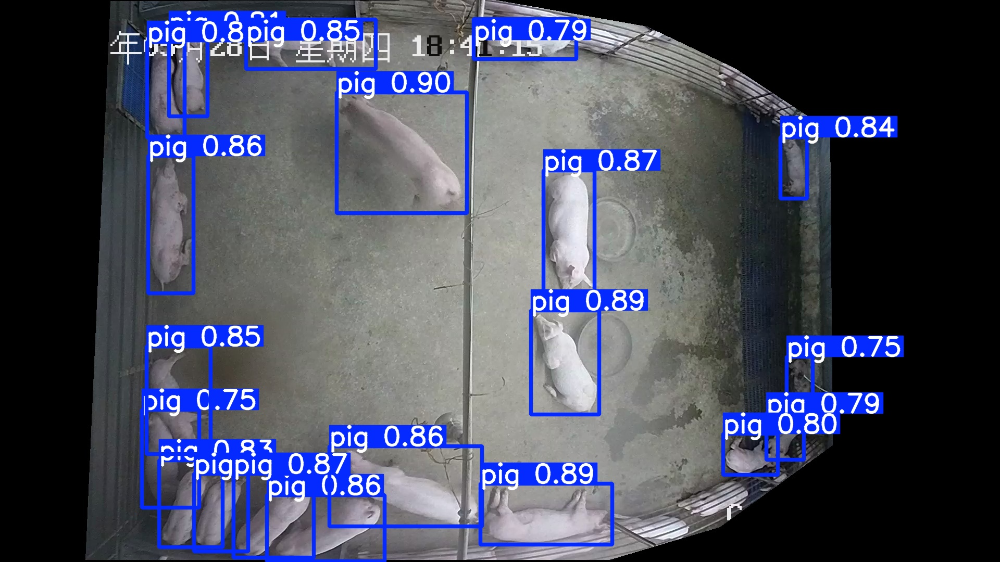

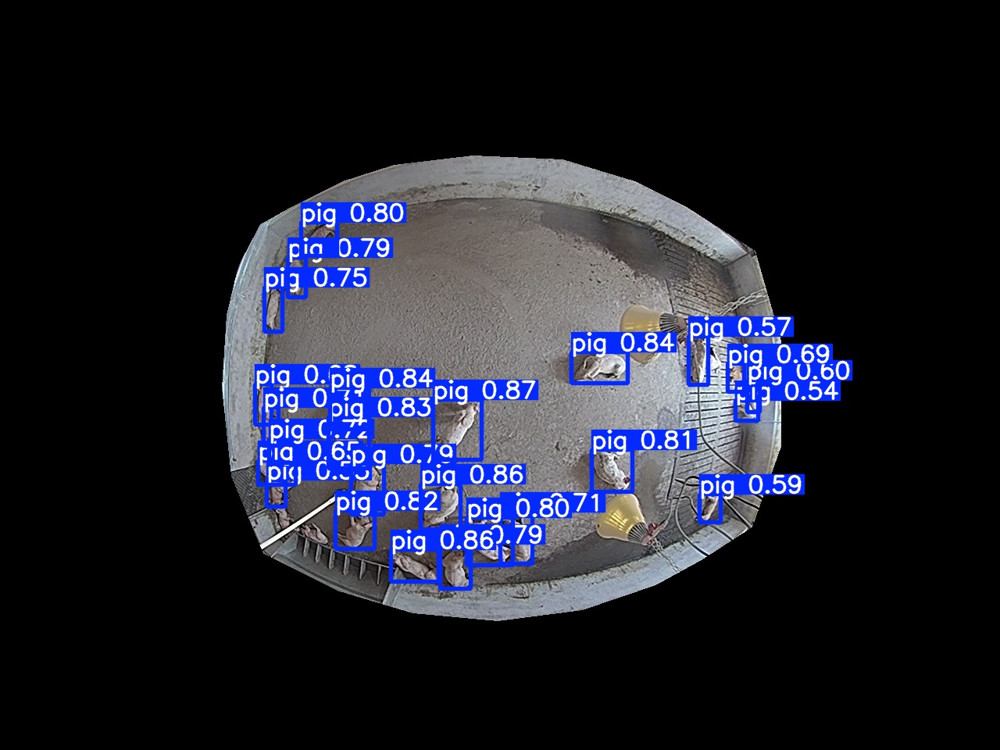

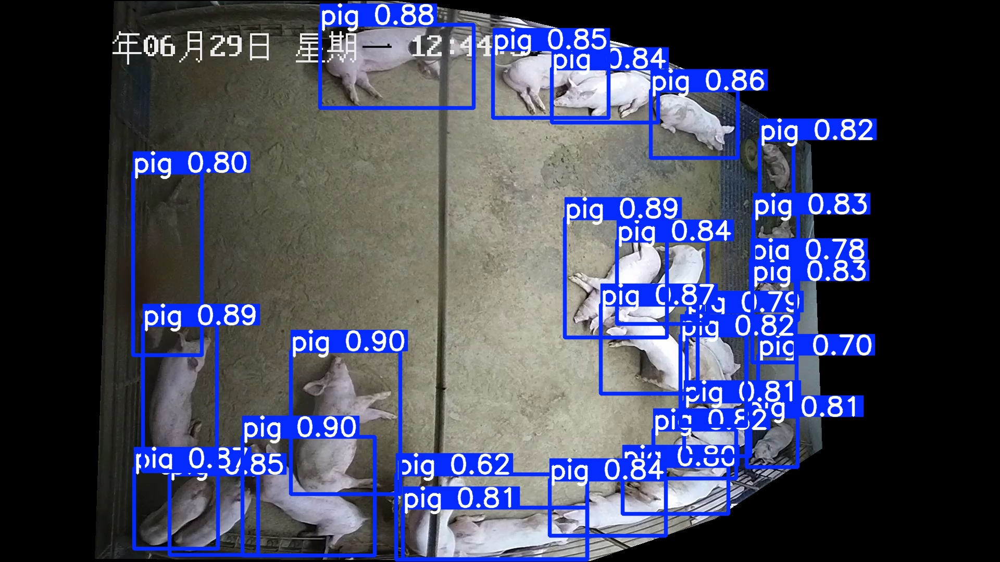

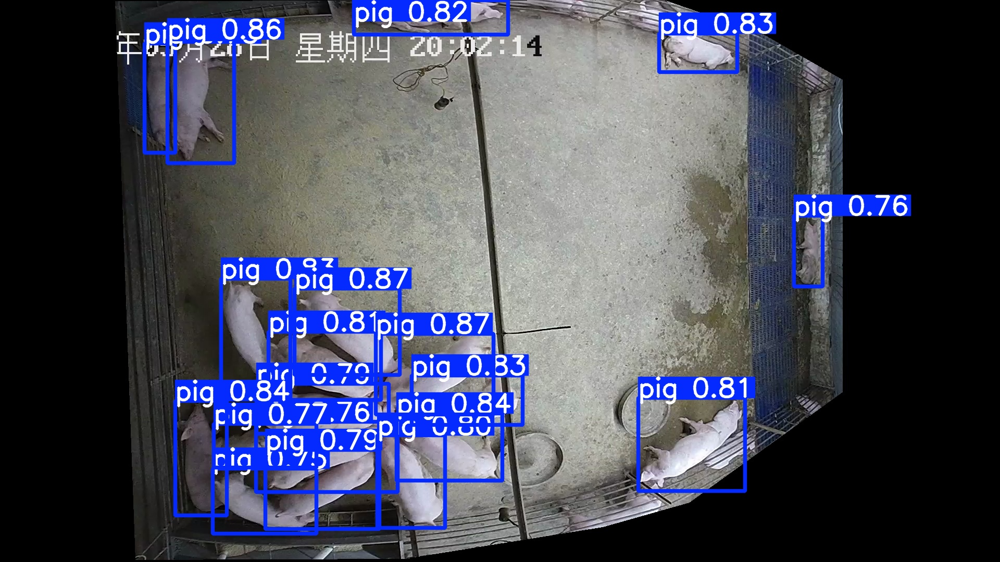

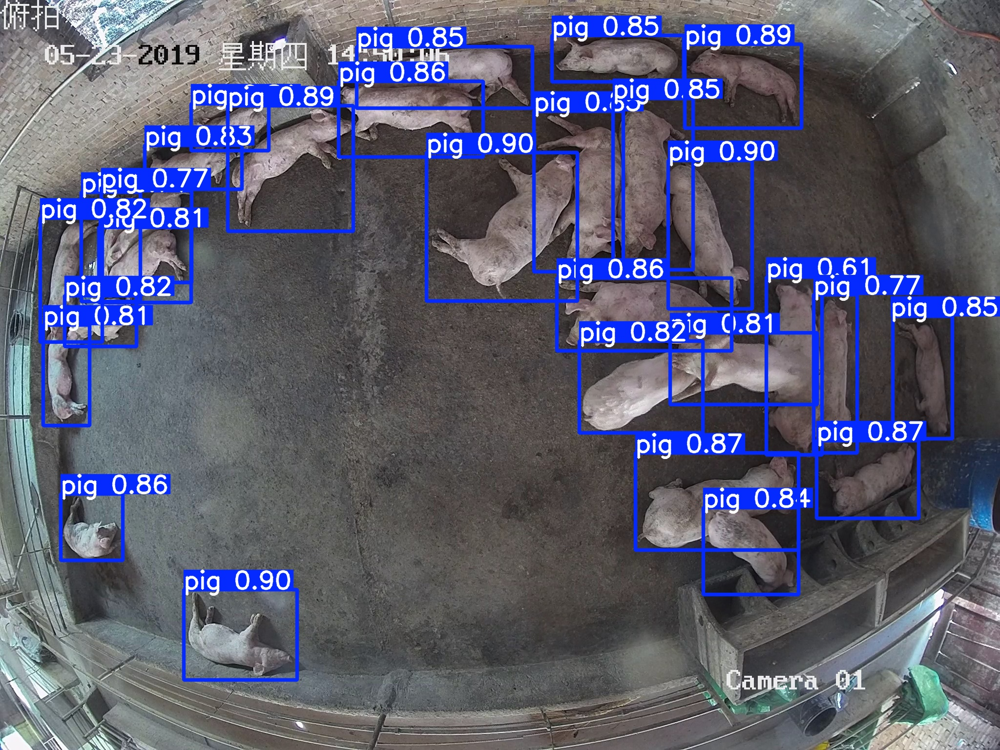

In [20]:
import glob
from IPython.display import Image, display

pred_dir = results[0].save_dir
pred_imgs = glob.glob(f"{pred_dir}/*.jpg")[:5]

print("🖼 Showing sample predictions:")
for img_path in pred_imgs:
    display(Image(filename=img_path, width=600))


In [21]:
import pandas as pd
import os

# Create an empty list to hold image results
counts = []

# Loop through all YOLO prediction results
for r in results:
    # Get image name (handle possible attribute differences)
    imgname = os.path.basename(r.path) if hasattr(r, 'path') else "unknown_image"

    # Get predicted boxes (number of pigs)
    num_pigs = len(r.boxes) if hasattr(r, 'boxes') else 0

    # Save results
    counts.append({
        'image_name': imgname,
        'predicted_pig_count': int(num_pigs)
    })

# Convert to DataFrame
df = pd.DataFrame(counts)

# Save to CSV
csv_path = '/content/predicted_pig_counts.csv'
df.to_csv(csv_path, index=False)

# Display confirmation
print(f"✅ Saved results to: {csv_path}\n")
print("📊 Preview (first 20 rows):")
print(df.head(20))


✅ Saved results to: /content/predicted_pig_counts.csv

📊 Preview (first 20 rows):
                 image_name  predicted_pig_count
0   1625702694_origin_1.jpg                   21
1   1625705888_origin_1.jpg                   31
2   1625706902_origin_1.jpg                   28
3   1625707918_origin_1.jpg                   27
4   1625708118_origin_1.jpg                   24
5   1625710301_origin_1.jpg                   29
6   1625710405_origin_1.jpg                   25
7   1625710811_origin_1.jpg                   31
8   1625716835_origin_1.jpg                   23
9   1625725571_origin_1.jpg                   24
10  1625726347_origin_1.jpg                   27
11  1625735151_origin_1.jpg                   28
12  1625735602_origin_1.jpg                   30
13  1625735831_origin_1.jpg                   33
14  1625740597_origin_1.jpg                   30
15  1625745146_origin_1.jpg                   22
16  1625745500_origin_1.jpg                   28
17  1625755441_origin_1.jpg         

🖼 Showing sample predictions with pig count:


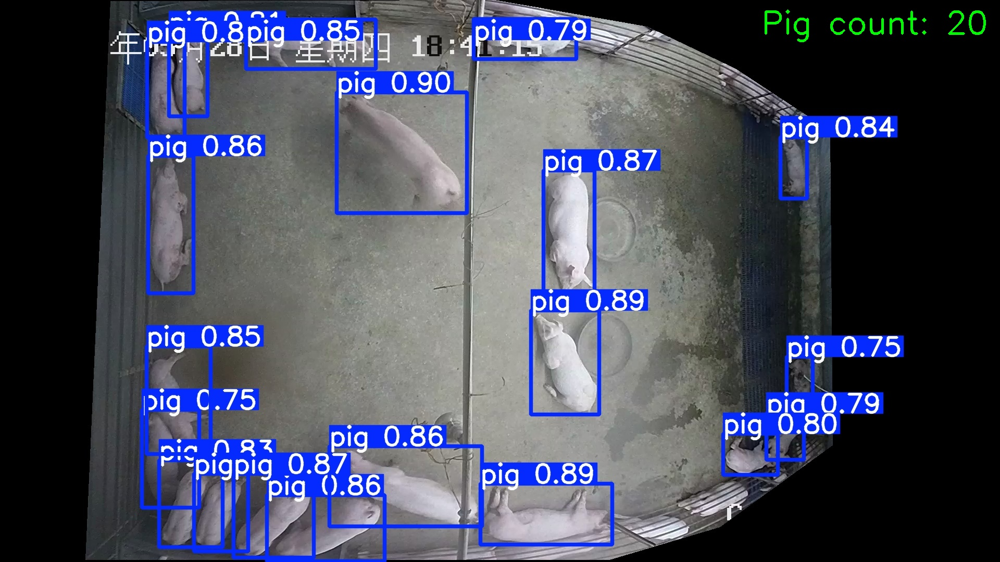

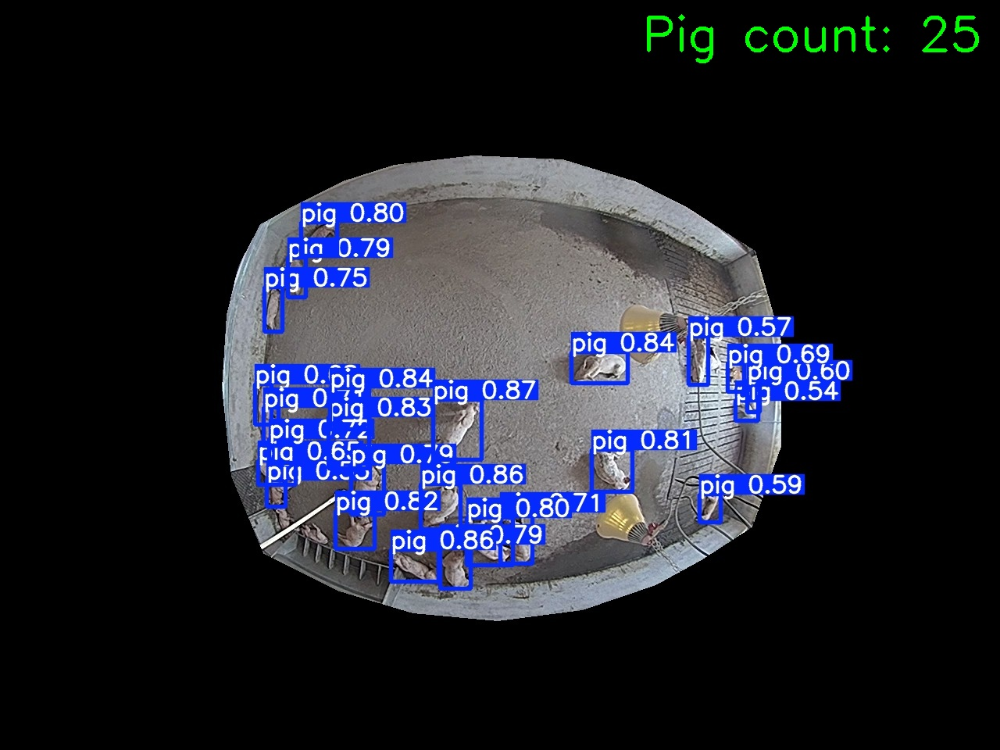

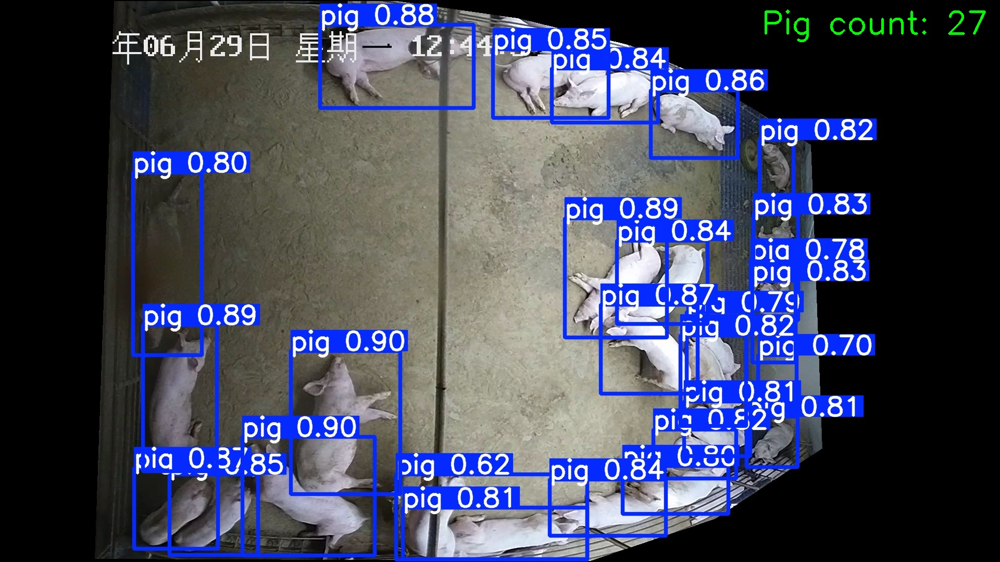

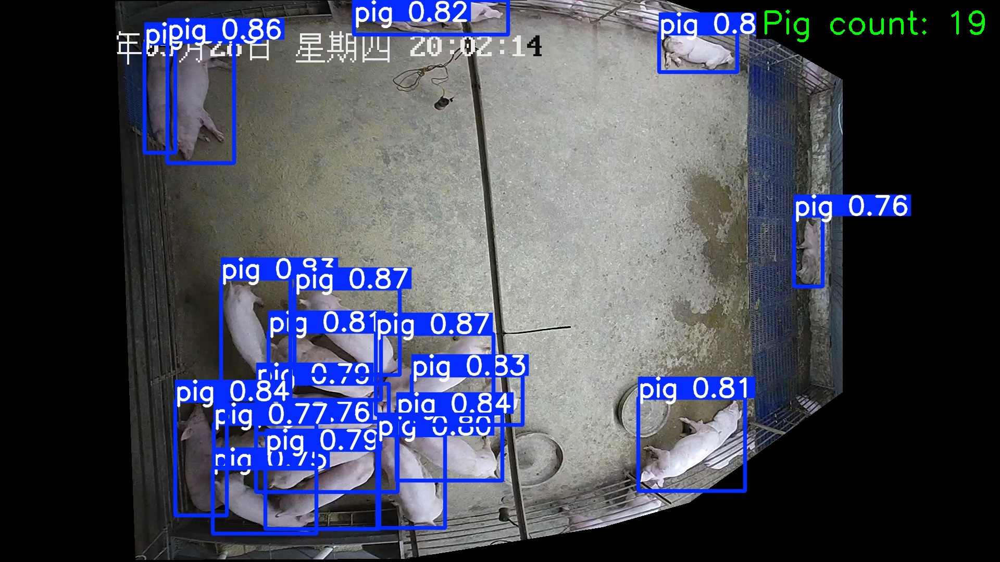

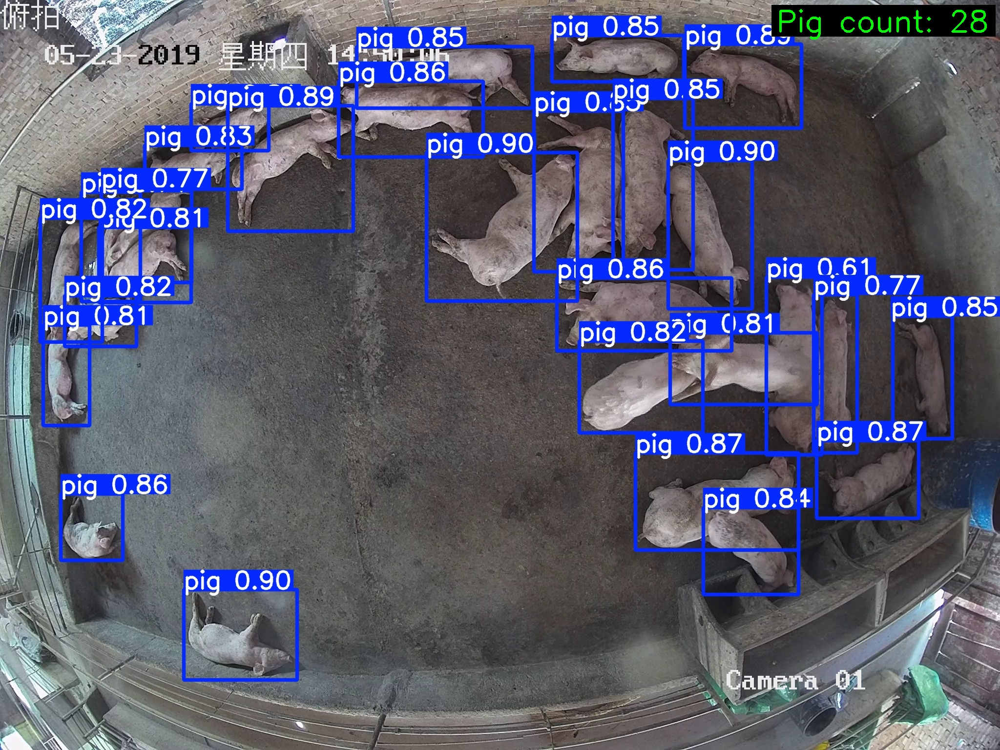

In [23]:
import cv2
import glob
import os
from IPython.display import Image, display

# Path to predicted images (change if needed)
pred_dir = results[0].save_dir
pred_imgs = glob.glob(f"{pred_dir}/*.jpg")

print("🖼 Showing sample predictions with pig count:")

for img_path in pred_imgs[:5]:  # show first 5
    # Read image
    img = cv2.imread(img_path)

    # Derive image name to match result
    img_name = os.path.basename(img_path)

    # Find matching result
    matched_result = next((r for r in results if os.path.basename(r.path) == img_name), None)

    if matched_result:
        pig_count = len(matched_result.boxes)
    else:
        pig_count = 0

    # Add text overlay (top-right corner)
    text = f"Pig count: {pig_count}"
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 2.0      # 🔥 Increased size (was 1)
    thickness = 4         # 🔥 Bolder text (was 2)
    color = (0, 255, 0)   # Green text
    margin = 20

    # Get text size
    text_size = cv2.getTextSize(text, font, font_scale, thickness)[0]
    text_x = img.shape[1] - text_size[0] - margin
    text_y = text_size[1] + margin

    # Draw text background (optional for visibility)
    cv2.rectangle(
        img,
        (text_x - 10, text_y - text_size[1] - 10),
        (text_x + text_size[0] + 10, text_y + 10),
        (0, 0, 0),
        -1
    )

    # Put text
    cv2.putText(img, text, (text_x, text_y), font, font_scale, color, thickness)

    # Save temporary image and display
    temp_path = f"/content/temp_{img_name}"
    cv2.imwrite(temp_path, img)
    display(Image(filename=temp_path, width=600))


In [26]:
import glob, os

# Find all YOLO run folders
run_dirs = sorted(glob.glob("/content/runs/detect/*"), key=os.path.getmtime)

if not run_dirs:
    print("❌ No YOLO training runs found.")
else:
    print("📂 Found YOLO runs:")
    for i, d in enumerate(run_dirs):
        print(f"[{i}] {d}")

    latest_run = run_dirs[-1]
    print(f"\n✅ Latest run: {latest_run}")


📂 Found YOLO runs:
[0] /content/runs/detect/pig_count_exp_clean
[1] /content/runs/detect/predict

✅ Latest run: /content/runs/detect/predict


In [28]:
import pandas as pd
import os

# Correct path to your training results
csv_path = '/content/runs/detect/pig_count_exp_clean/results.csv'

# Check file exists
if not os.path.exists(csv_path):
    print(f"File not found at: {csv_path}")
else:
    # Load and show last metrics
    df = pd.read_csv(csv_path)
    print("Training metrics (last 5 epochs):")
    print(df.tail())

    # Extract the final epoch
    last = df.iloc[-1]
    print("\nFinal Model Performance:")
    print(f"Precision: {last['metrics/precision(B)']:.4f}")
    print(f"Recall: {last['metrics/recall(B)']:.4f}")
    print(f"mAP50: {last['metrics/mAP50(B)']:.4f}")
    print(f"mAP50-95: {last['metrics/mAP50-95(B)']:.4f}")


Training metrics (last 5 epochs):
    epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  \
95     96  2857.84         0.85836         0.40301         0.90644   
96     97  2886.80         0.85953         0.40385         0.90497   
97     98  2915.59         0.86002         0.40283         0.90612   
98     99  2944.37         0.85315         0.40032         0.90161   
99    100  2973.14         0.85488         0.40261         0.90422   

    metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
95               0.96557            0.92461           0.97330   
96               0.96797            0.92417           0.97388   
97               0.96759            0.92281           0.97321   
98               0.96767            0.92527           0.97336   
99               0.96731            0.92434           0.97369   

    metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
95              0.71245       0.99772       0.44348       0.93325  0.000119

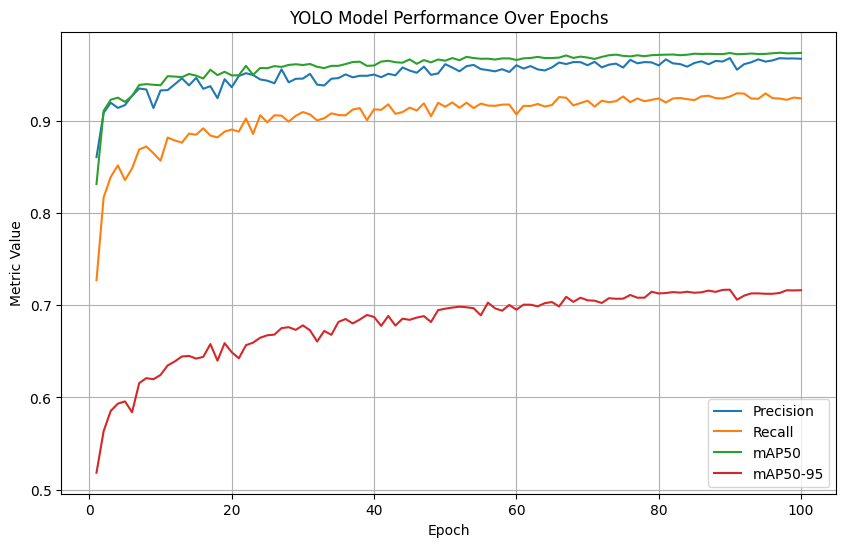

In [29]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.plot(df['epoch'], df['metrics/precision(B)'], label='Precision')
plt.plot(df['epoch'], df['metrics/recall(B)'], label='Recall')
plt.plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP50')
plt.plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP50-95')
plt.xlabel('Epoch')
plt.ylabel('Metric Value')
plt.title('YOLO Model Performance Over Epochs')
plt.legend()
plt.grid(True)
plt.show()



image 1/1 /content/dataset/PIG COUNTING/images/test/1625707918_origin_1.jpg: 480x640 27 pigs, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/runs/detect/predict9
🐷 Pig count detected: 27


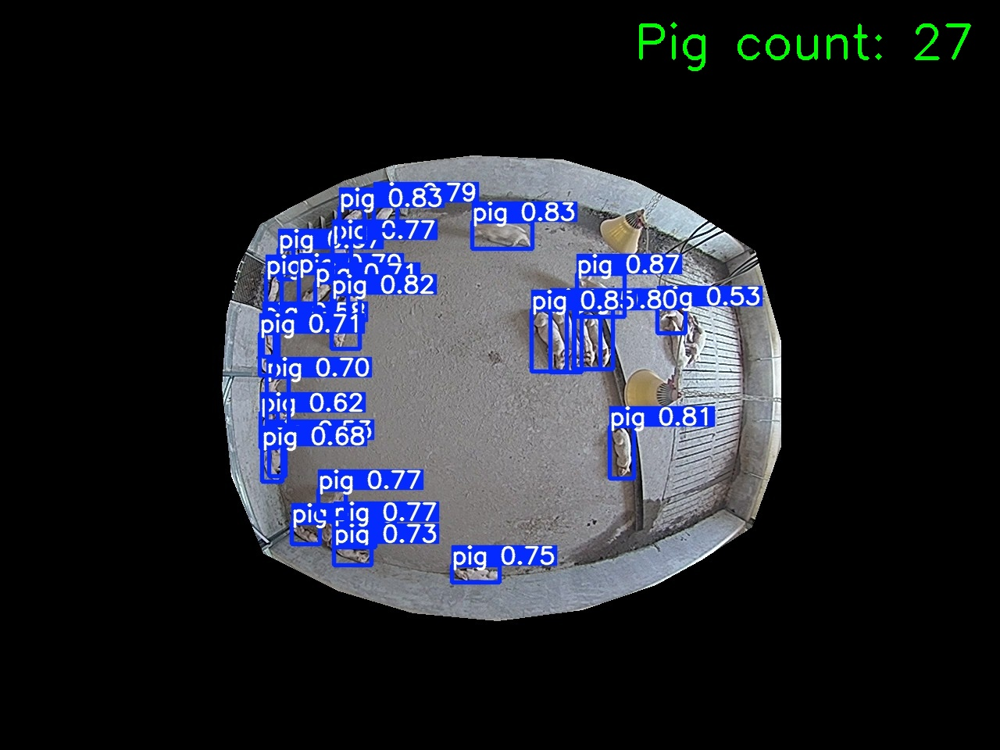

In [40]:
from ultralytics import YOLO
import cv2, os
from IPython.display import Image, display

# === 1️⃣ Load your trained YOLO model ===
model = YOLO('/content/runs/detect/pig_count_exp_clean/weights/best.pt')

# === 2️⃣ Set the image path ===
img_path = '/content/dataset/PIG COUNTING/images/test/1625707918_origin_1.jpg'  # <-- change if needed

# === 3️⃣ Run prediction ===
results = model.predict(source=img_path, save=True, conf=0.5)

# === 4️⃣ Get pig count ===
pig_count = len(results[0].boxes)
print(f"🐷 Pig count detected: {pig_count}")

# === 5️⃣ Overlay "Pig count: X" on the image ===
pred_img_path = results[0].save_dir + '/' + os.path.basename(img_path)
img = cv2.imread(pred_img_path)

# Prepare text settings
text = f"Pig count: {pig_count}"
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 2          # larger text
color = (0, 255, 0)     # green
thickness = 4
margin = 30

# Compute text position (top-right corner)
text_size = cv2.getTextSize(text, font, font_scale, thickness)[0]
text_x = img.shape[1] - text_size[0] - margin
text_y = text_size[1] + margin

# Draw background box for better visibility
cv2.rectangle(
    img,
    (text_x - 10, text_y - text_size[1] - 10),
    (text_x + text_size[0] + 10, text_y + 10),
    (0, 0, 0),
    -1
)

# Add text to image
cv2.putText(img, text, (text_x, text_y), font, font_scale, color, thickness)

# === 6️⃣ Save and display the modified image ===
output_path = '/content/single_result_with_count.jpg'
cv2.imwrite(output_path, img)
display(Image(filename=output_path, width=800))
